### Imports

In [1]:
import matplotlib
import parselmouth
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import librosa
from librosa.display import waveplot, specshow
import pandas as pd
from matplotlib import gridspec
from essentia.standard import TonicIndianArtMusic
from IPython.display import Audio
import scipy.signal as sig
sns.set_theme()

### Define Parameters and Variables

<ul>
    <li>min_pitch - minimum pitch played in the song (used for pitch tracking); corresponds to the lower Pa of the sitar</li>
    <li>max_pitch - max pitch played in the song (used for pitch tracking); corresponds to the higher Sa of the sitar</li>
    <li>start_time - start time of the segment that is to be plotted (seconds)</li>
    <li>end_time - end time of the segment that is to be plotted (seconds)</li>
    <li>sitar_audio_path - path to audio file of only sitar</li>
    <li>mix_audio_path - path to the mix audio file to be analysed</li>
    <li>cycle_file - path to the file with annotation of sams in the song</li>
    <li>sitar_onset_file - path to the file where the sitar onsets are marked</li>
</ul>

In [2]:
min_pitch = 220 
max_pitch = 880 
start_time = 1140
end_time = 1170
sitar_audio_path = 'Data/NIR_ABh_Puriya_Sitar1.wav'
mix_audio_path = 'Data/NIR_ABh_Puriya_StereoMix.wav'
cycle_file = 'Data/NIR_ABh_Puriya_Metre_VilambitTeental.csv'
sitar_onset_file = 'Data/NIR_ABh_Puriya_Onsets_Selected_VilambitTeental.csv'

Tonic of the file is at D4, which is 293.66 Hz

In [3]:
tonic = 293.66

We load only the relevant part of the audio file here. Audio is loaded in mono, and sample rate is unchanged.<br>
The frequencies sung are extracted using a software called Praat.

In [4]:
sitar_audio, sitar_sr = librosa.load(sitar_audio_path, sr=None, mono=True, offset=start_time, duration = end_time - start_time)
snd = parselmouth.Sound(sitar_audio, sitar_sr)
pitch = snd.to_pitch_ac(0.01, min_pitch, 15, True, 0.03, 0.45, 0.01, 0.9, 0.14, max_pitch)
cycle_df = pd.read_csv(cycle_file)
index_values = cycle_df.loc[(cycle_df['Time'] >= start_time) & (cycle_df['Time'] <= end_time)].index.values
annotated_beats = cycle_df.iloc[max(index_values[0]-1, 0):min(index_values[-1]+2, cycle_df.shape[0])]
# add all matras to show - each annotated beat has 4 divisions
matras = []
for ind, beats in enumerate(annotated_beats['Time'].values[:-1]):
    matras.extend(np.around(np.linspace(beats, annotated_beats['Time'].values[ind+1], num = 4, endpoint=False), 2)[1:])

Extract sitar onsets from the annotation file

In [5]:
sitar_onset_vals = pd.read_csv(sitar_onset_file)
sitar_onset_vals = sitar_onset_vals.loc[(sitar_onset_vals['Inst'] >= start_time) & (sitar_onset_vals['Inst'] <= end_time)]

Use the stereo mix audio to find the values of the spectogram

In [6]:
#spectogram (created using the stereo mix audio)
mix_audio, mix_sr = librosa.load(mix_audio_path, sr=None, mono=True, offset=start_time, duration = end_time - start_time)

# stft params
winsize = int(np.ceil(mix_sr*40e-3))
hopsize = int(np.ceil(mix_sr*10e-3))
nfft = int(2**np.ceil(np.log2(winsize)))

f,t,X = sig.stft(mix_audio, fs=mix_sr, window='hann', nperseg=winsize, noverlap=(winsize-hopsize), nfft=nfft)
X_dB = librosa.power_to_db(np.abs(X), ref = np.max, amin=1e-4)

Play the audio being analysed

In [7]:
Audio(mix_audio, rate=mix_sr)

Plotting the pitch contour. Matras are marked with a vertical line - solid line indicating a vibhaag and dotted line indicating a matra; and the cycle number is noted in a box at the bottom of the line.

In [8]:
yNoteCents = np.array([-300, -100, 0, 100, 400, 600, 900, 1100, 1200, 1300, 1600, 1800])
# yNoteHz = np.array([246.94, 277.18, 293.66, 311.13, 369.99, 415.3, 493.88, 554.37, 587.33, 622.25, 739.99, 830.61])
yNotes = np.array(["D_", "N_", "S", "r", "G", "m", "D", "N", "S'", "r'", "G'", "m'"])

Play the audio being analysed

In [9]:
Audio(sitar_audio, rate=sitar_sr)

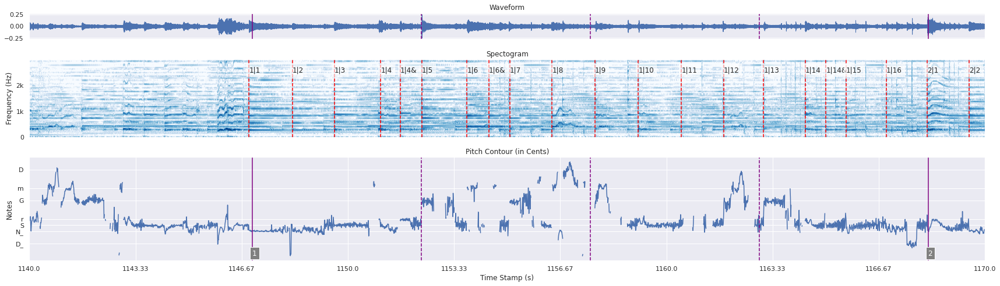

In [10]:
xvals = pitch.xs()
yvals = pitch.selected_array['frequency']
yvals[yvals==0] = np.nan
yvals[~(np.isnan(yvals))] = 1200*np.log2(yvals[~(np.isnan(yvals))]/tonic)
fig = plt.figure(figsize=(24, 7))
specs = fig.add_gridspec(3, 1, height_ratios = [1, 3, 4])
axs = [fig.add_subplot(specs[0, 0]), fig.add_subplot(specs[1, 0]), fig.add_subplot(specs[2, 0])]
#plot the waveform
waveplot(mix_audio, mix_sr, ax=axs[0])
axs[0].set(xlabel='', title='Waveform')
#plot spectogram
specshow(X_dB, x_axis='time', y_axis='linear', sr=mix_sr, fmax=mix_sr//2, hop_length=hopsize, ax=axs[1], cmap='Blues')
axs[1].set(ylabel='Frequency (Hz)', xlabel='', title='Spectogram')
#plot pitch contour
axs[2] = sns.lineplot(x=xvals, y=yvals, ax=axs[2])
axs[2].set(xlabel='Time Stamp (s)', ylabel='Notes', title='Pitch Contour (in Cents)')
for i, beat in annotated_beats.iterrows():
    #plot beats
    if beat['Time'] >= start_time and beat['Time'] <= end_time:
        axs[0].axvline(beat['Time']-start_time, linestyle='-', c='purple')
        axs[2].axvline(beat['Time']-start_time, linestyle='-', c='purple')
        axs[2].annotate(beat['Cycle'], (beat['Time']-start_time, min(yvals)+10), bbox=dict(facecolor='grey', edgecolor='white'), c='white')
for matra in matras:
    if matra >= start_time and matra <= end_time:
        axs[0].axvline(matra-start_time, linestyle='--', c='purple')
        axs[2].axvline(matra-start_time, linestyle='--', c='purple')
for _, onset in sitar_onset_vals.iterrows():
    axs[1].axvline(onset['Inst']-start_time, linestyle='--', c='red')
    axs[1].annotate(onset['Label'], (onset['Inst']-start_time, 2500), bbox={'facecolor':'white', 'alpha':0.6})
axs[2].set_xlim(0, end_time-start_time)
axs[2].set_xticks(np.linspace(0, end_time-start_time, 10))
axs[2].set_xticklabels(np.around(np.linspace(0, end_time-start_time, 10) + start_time, 2))
axs[1].set_xticks([])
axs[1].set_xlim(axs[2].get_xlim())
axs[0].set_xticks([])
axs[0].set_xlim(axs[2].get_xlim())
axs[2].set_yticks(yNoteCents[(yNoteCents >= min(yvals)) & (yNoteCents <= max(yvals))])
axs[2].set_yticklabels(yNotes[(yNoteCents >= min(yvals)) & (yNoteCents <= max(yvals))])
axs[1].set_ylim(0, 3000)
axs[1].set_yticks([0, 1e3, 2e3])
axs[1].set_yticklabels(['0', '1k', '2k'])
fig.tight_layout()

Audio mixed with clicks at the sitar oset points

In [11]:
click_track = librosa.clicks(sitar_onset_vals['Inst'].values-start_time, sr=sitar_sr, length=len(sitar_audio))
Audio(0.8*sitar_audio + 0.2*click_track, rate=sitar_sr)